## Cumputer Vision
### Module 3. Object Tracking and Search

Anastasiia Kasprova

    Link to Google Colab: 
    Link to github: https://github.com/kasprova/CV_UCU/tree/master/module3/tasks

### Task 3.3: Content-Based Image Retrieval

1. Write a program to extract the color histogram of each of the 2,000 images. Choose the parameters required with justifications. Implement your own histogram code and compare its results with open-source API like OpenCV and numpy. Required submission: source code with comments 
 
2. Write a program to measure the L​2 ​distance between color histograms of two images. Required submission: source code with comments. 
 
3. Use 5 images shown above (ukbench00004.jpg; ukbench00040.jpg; ukbench00060.jpg; ukbench00588.jpg; ukbench01562.jpg) as queries. For each query image, find 10 best matches from the 2,000 images based on the color histogram similarity. Plot the query image and the 10 returned matches (use icons of reduced resolution to save space). Required submission: source code with comments, plots of matched images for each query. 

4. Write a program to measure and plot the P-R curve for each query. Required submission: source code with comments, plots of P-R curves. 
 
5. Discuss and explain success and failure cases. Required submission: written report (at least 1 paragraph) 
 
6. (Optional) try to improve the results by using a different feature or distance metrics (bag of words, 3d-color histograms etc) of your choice. Justify your choice with qualitative reasons and back it up with performance comparison results. Required submission: source code with comments, plots or results and P-R curves, written report . 
 
All tasks should be done in Python with usage of OpenCV as a tool for reading and manipulating the images. 
 
References: https://acutecaretesting.org/en/articles/precision-recall-curves-what-are-they-and-how-are-they-used
 

In [17]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance as dist
from sklearn import preprocessing
import glob
%matplotlib inline

### 1. Extraction of colour histogram

#### Opencv 2D histogram

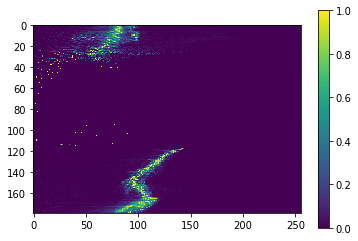

In [19]:
#read image
img = cv2.imread('data/Bird2/Bird2/img/0001.jpg')
#convert to HSV
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
hist = cv2.calcHist(images = [hsv], 
                    channels = [0, 1], #need to process both H and S plane
                    mask = None, 
                    histSize = [180, 256], #180 H plane, 256 S plane
                    ranges = [0, 180, 0, 256],
                    ) # Hue in range[0,180], Saturation in range [0,256]
#normalize histogram
hist = preprocessing.normalize(hist,norm = "max")

plt.imshow(hist, interpolation = 'nearest')
plt.colorbar()
plt.show()

#### Numpy 2D histogram

In [30]:
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('data/Bird2/Bird2/img/0001.jpg')
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

hist_np, xbins, ybins = np.histogram2d(x = hsv[:,:,0].ravel(),
                                    y = hsv[:,:,1].ravel(),
                                    bins = [hue_range,saturation_range],
                                    range = [[0,hue_range],[0,saturation_range]])
#normalize histogram
hist_np = preprocessing.normalize(hist_np,norm = "max")

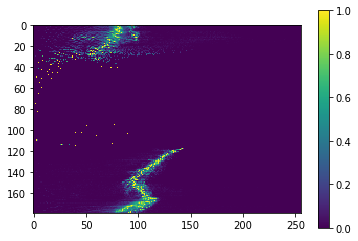

In [31]:
plt.imshow(hist_np, interpolation = 'nearest')
plt.colorbar()
plt.show()

#### Custom 2D histogram implementation

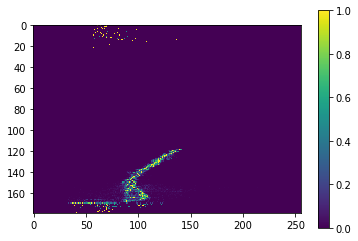

In [40]:
fpath = 'data/Bird2/Bird2/img/0001.jpg'
#read image
img = cv2.imread(fpath)
#read image dimentions
height, weight, channel = img.shape
#convert to HSV space
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

#possible values of hue and saturation
hue_range = 180
saturation_range = 256
#define histogram size
hist_size = [hue_range,saturation_range] #or any other number of bins for both hue and saturation channels

#initialization of histogram 2D array
hist2d = np.zeros(hist_size)

for i in range(hist_size[1]): 
    for j in range(hist_size[0]):
        hue = hsv[i,j,0]
        saturation = hsv[i,j,1]
        hue_bin = np.int32(hist_size[0] * hue / hue_range)
        saturation_bin = np.int32(hist_size[1] * saturation / saturation_range)
        hist2d[hue_bin,saturation_bin] += 1

#normalize histogram
hist2d = preprocessing.normalize(hist2d,norm = "max")

#visualization
plt.imshow(hist2d, interpolation = 'nearest')
plt.colorbar()
plt.show()

In [43]:
#check diff
np.sum(hist - hist_np), np.sum(hist - hist2d), np.sum(hist_np - hist2d)

(1.2546821220871252e-14, 691.3464115696273, 691.3464115696273)

#### Conclusion 1: Custom result of 2D - histogram is closed to opencv and numpy one, but not the same.

--------

#### Function to extract color histogram of images from the dataset

In [76]:
def get_color_extract_opencv(fpath):
    #read image
    img = cv2.imread(fpath)
    #convert to HSV
    hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist(images = [hsv], 
                    channels = [0, 1], #need to process both H and S plane
                    mask = None, 
                    histSize = [180, 256], #180 H plane, 256 S plane
                    ranges = [0, 180, 0, 256],
                    ) # Hue in range[0,180], Saturation in range [0,256]
    #normalize histogram
    hist = preprocessing.normalize(hist,norm = "max")
    return hist

#### Extract color from all the images in dataset "benchmark_image_db"

In [51]:
#! ls data/benchmark_image_db

In [127]:
path_to_folder = "data/benchmark_image_db/"
#read paths to dataset images
filenames = glob.glob(path_to_folder+"*.jpg")
#create list of histograms
histogram_list = [get_color_extract_opencv(fpath) for index,fpath in enumerate(filenames)]

----

### 2. L​2 ​distance between color histograms of two images

In [122]:
def l2_distance(hist1, hist2):
    return np.linalg.norm(np.subtract(hist1, hist2))

In [126]:
l2_distance(histogram_list[0], histogram_list[1])

25.01992

Text(0.5,1,'histogram')

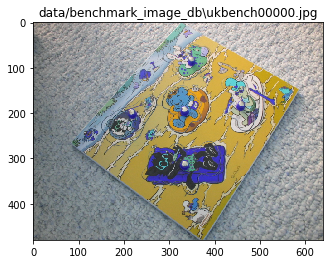

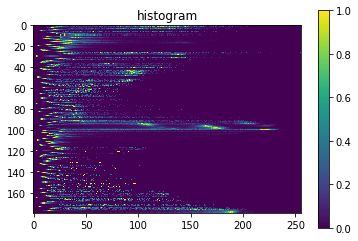

In [125]:
#visualization
plt.figure(1)
plt.imshow(cv2.imread(filenames[0],cv2.COLOR_BGR2RGB))
plt.title(filenames[0])

plt.figure(2)
plt.imshow(histogram_list[0], interpolation = "nearest")
plt.colorbar()
plt.title("histogram")

Text(0.5,1,'histogram')

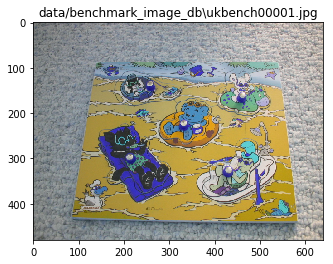

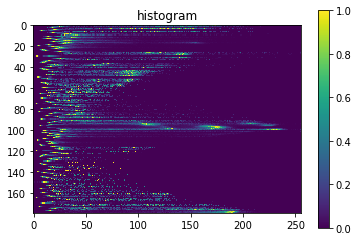

In [124]:
#visualization
plt.figure(1)
plt.imshow(cv2.imread(filenames[1],cv2.COLOR_BGR2RGB))
plt.title(filenames[1])

plt.figure(2)
plt.imshow(histogram_list[1], interpolation = "nearest")
plt.colorbar()
plt.title("histogram")

----

### 3.  Find 10 best matches from the 2,000 images based on the color histogram similarity for images: 
    ukbench00004.jpg 
    ukbench00040.jpg
    ukbench00060.jpg 
    ukbench00588.jpg 
    ukbench01562.jpg

In [135]:
def get_index_by_image_name(list, substring):
    for i, s in enumerate(list):
        if substring in s:
              return i
    return -1

In [163]:
def best_image_histogram_match(image_name, histogram_list, filenames, number_of_nearest_neighbors = 10):
    """
    Return: list of image names
    Arguments:
        image_name - str - name of image which close relatives 
                           we want to find based on their color 2d histograms
        histogram_list - list of 2d histograms of images in dataset
        filenames - str - list of images names (included relative path to the folder)
        number_of_nearest_neighbors - number of similar images to the initial one we would like to find
    """
    #get index of the input image
    index = get_index_by_image_name(filenames,image_name)
    
    #initialize lists to store distance and names of nearest neighbours
    distance_list = []
    nearest_neighbours_name_list = []
    
    #calculate l2 distance between input image and all the rest in the dataset
    for hist in histogram_list:
        distance_list = np.append(distance_list,l2_distance(histogram_list[index], hist))
    
    #sort distance list by distance value
    nearest_neighbours_index_list = np.argsort(distance_list)
    
    #iterate through nn_index_list starting from 2 image (since the first one corrsponds to the input image)
    #to get the names of images with number of iteration = number_of_nearest_neighbors
    for i in nearest_neighbours_index_list[1:number_of_nearest_neighbors+1]:
        nearest_neighbours_name_list = np.append(nearest_neighbours_name_list, filenames[i])
    
    return nearest_neighbours_name_list
  

In [206]:
def image_neighbours_visualization(image,path_to_folder,histogram_list, filenames):
    plt.figure()
    plt.imshow(cv2.cvtColor(cv2.imread(path_to_folder+image),cv2.COLOR_BGR2RGB))
    plt.title(f'Original query image {image}')
    print("10 neightbours list")
    
    image_list = best_image_histogram_match(image,histogram_list, filenames)
    for i, name in enumerate(image_list):
        plt.figure(i)
        plt.imshow(cv2.cvtColor(cv2.imread(name),cv2.COLOR_BGR2RGB))
        plt.title(f"{i+1}: {name}")
        plt.show()
        

10 neightbours list


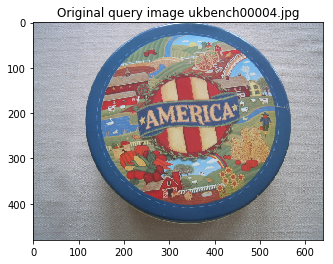

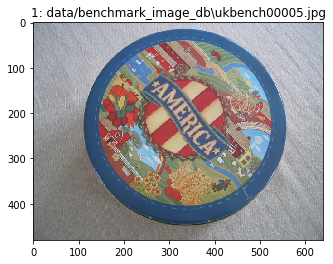

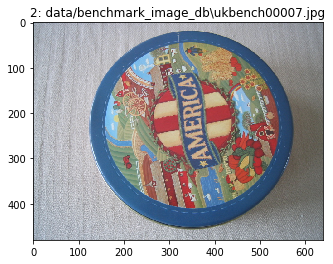

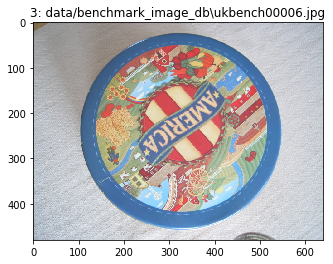

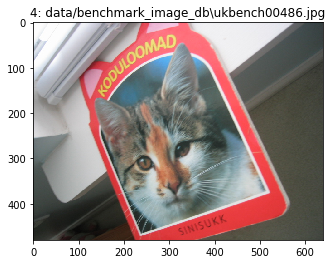

...

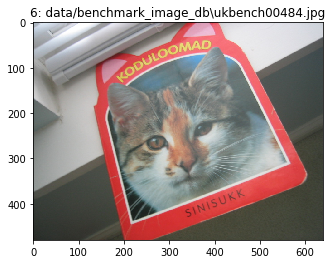

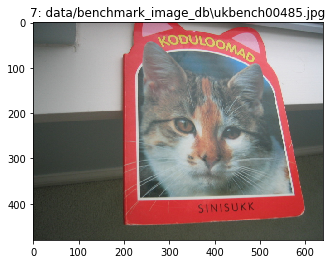

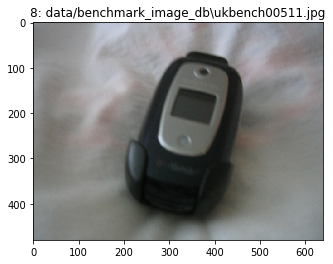

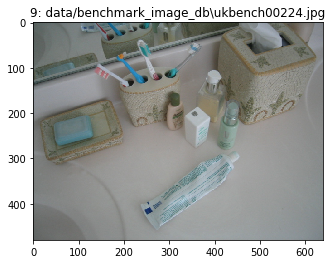

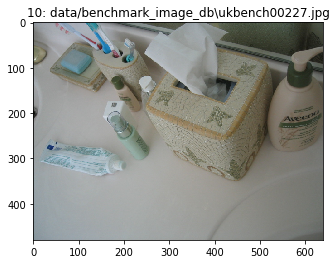

In [207]:
image_neighbours_visualization("ukbench00004.jpg", "data/benchmark_image_db\\", histogram_list, filenames)

10 neightbours list


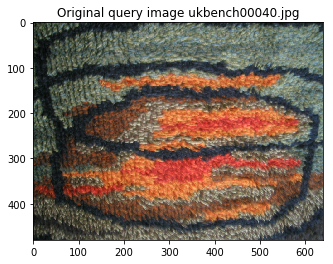

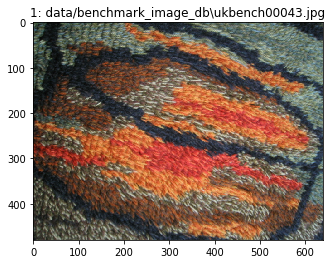

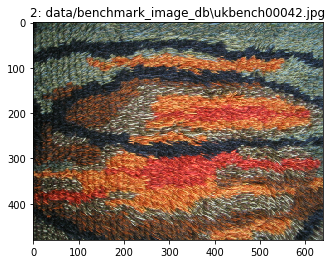

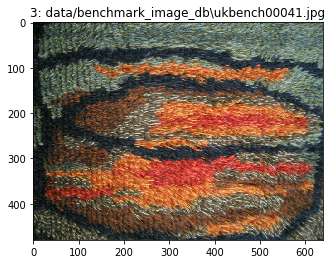

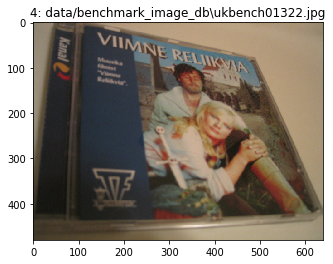

...

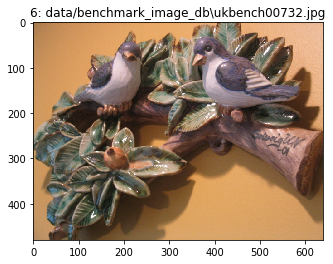

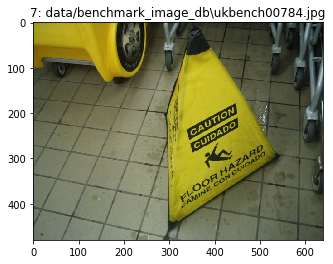

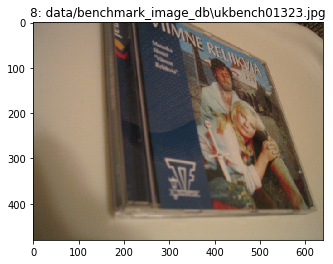

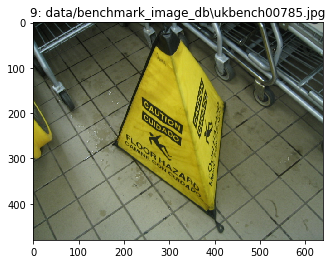

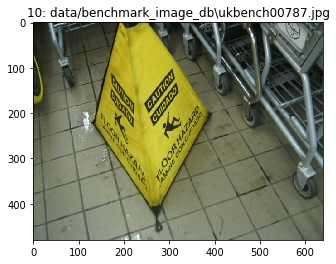

In [208]:
image_neighbours_visualization("ukbench00040.jpg", "data/benchmark_image_db\\", histogram_list, filenames)

10 neightbours list


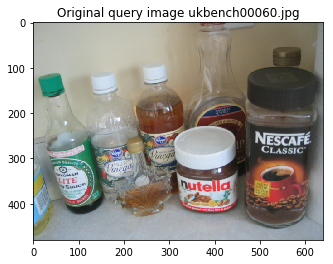

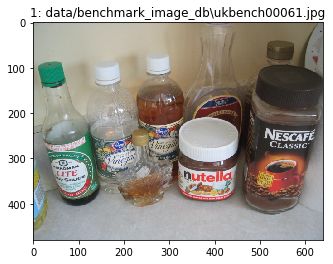

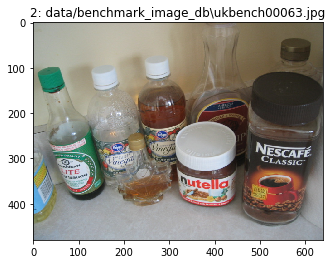

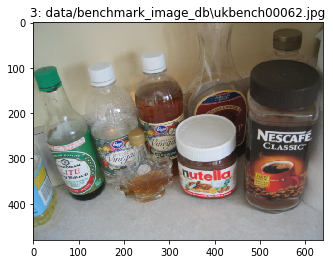

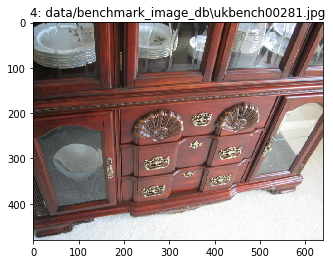

...

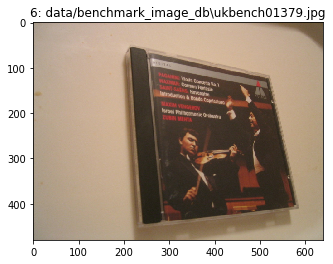

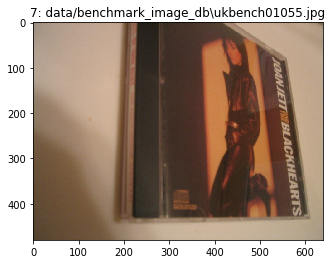

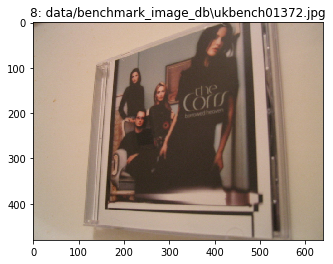

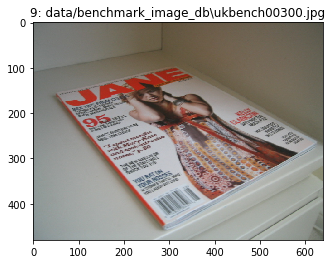

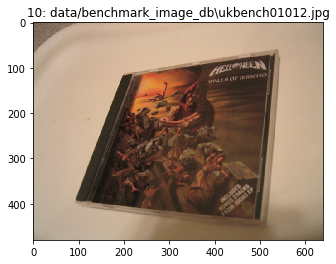

In [209]:
image_neighbours_visualization("ukbench00060.jpg", "data/benchmark_image_db\\", histogram_list, filenames)

10 neightbours list


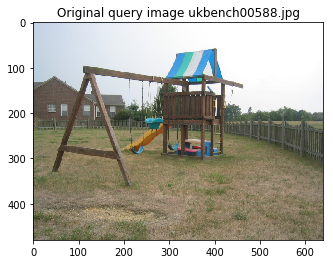

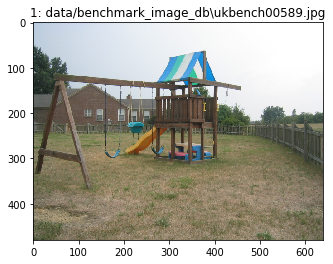

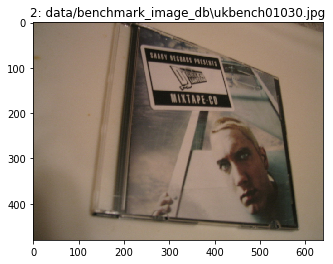

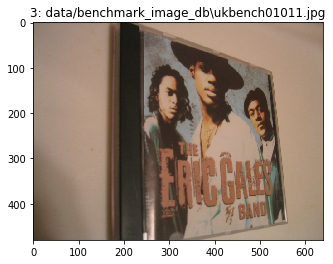

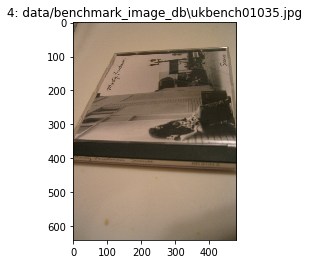

...

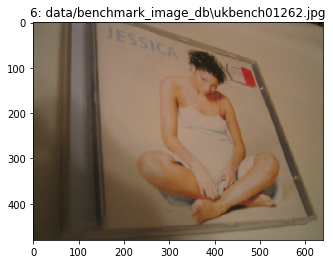

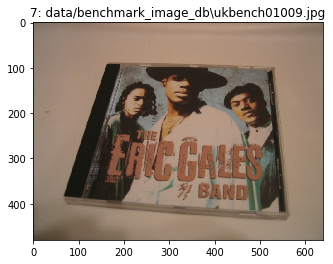

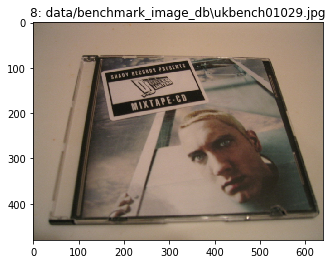

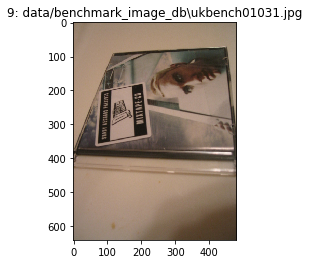

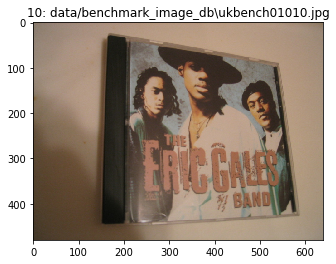

In [210]:
image_neighbours_visualization("ukbench00588.jpg", "data/benchmark_image_db\\", histogram_list, filenames)

10 neightbours list


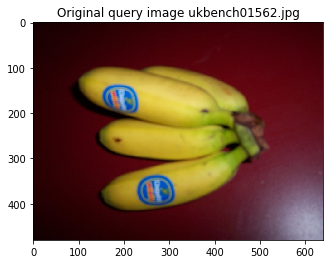

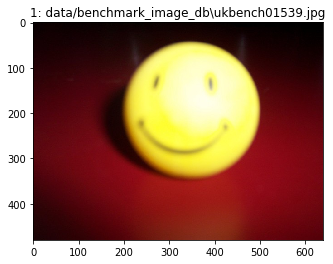

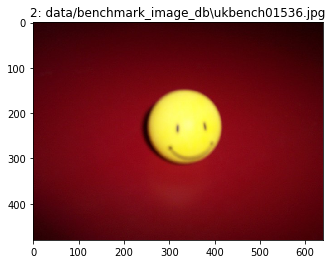

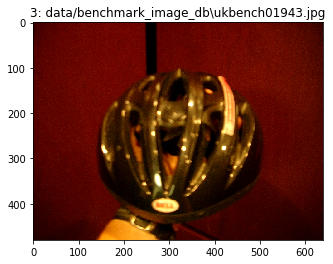

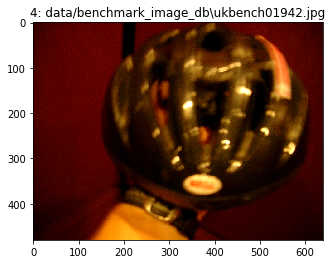

...

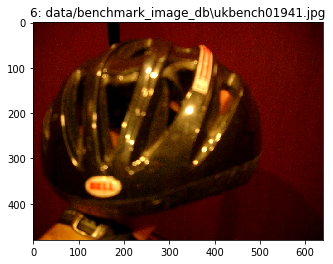

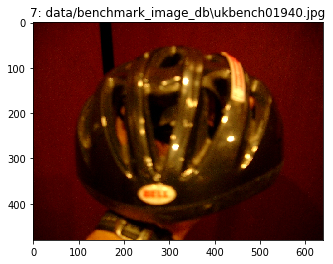

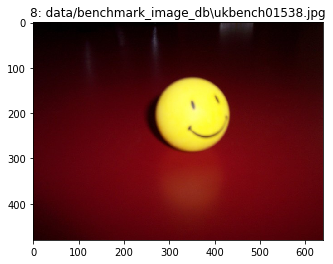

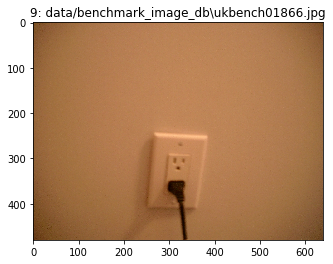

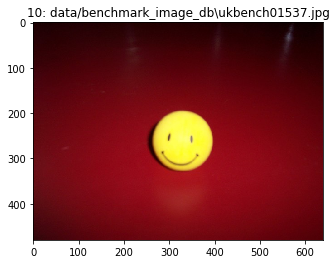

In [211]:
image_neighbours_visualization("ukbench01562.jpg", "data/benchmark_image_db\\", histogram_list, filenames)

-------

#### 4. Measure and plot the P-R curve

----

#### Reference:
1. https://docs.opencv.org/3.1.0/d1/db7/tutorial_py_histogram_begins.html
2. https://www.pyimagesearch.com/2014/07/14/3-ways-compare-histograms-using-opencv-python/
3. https://docs.opencv.org/master/dd/d0d/tutorial_py_2d_histogram.html